# PTM Dataset Analysis

## Replacement Statistics and Token Counts
Use this notebook to review PTM token coverage, spot annotation conflicts, and audit duplicate records across datasets.


In [15]:
import csv
import re
from collections import Counter
from typing import Dict

PTM_PATTERN = re.compile(r"<([^>]+)>")


def count_ptm_replacements(file_path: str) -> Dict[str, object]:
    """
    @param file_path: Absolute path to CSV with ori_seq and ptm_seq columns.
    @returns: Dict containing row stats and counters for PTM replacements.
    """
    token_counts: Counter = Counter()
    pair_counts: Counter = Counter()
    total = 0
    aligned = 0

    with open(file_path, newline="") as fh:
        reader = csv.DictReader(fh)
        for row in reader:
            total += 1
            ori = row["ori_seq"]
            ptm = row["ptm_seq"]

            i_ori = 0
            i_ptm = 0
            ok = True

            while i_ptm < len(ptm):
                ch = ptm[i_ptm]
                if ch == "<":
                    end = ptm.find(">", i_ptm + 1)
                    if end == -1:
                        ok = False
                        break
                    token = ptm[i_ptm + 1 : end]
                    if i_ori >= len(ori):
                        ok = False
                        break
                    token_counts[token] += 1
                    pair_counts[(ori[i_ori], token)] += 1
                    i_ori += 1
                    i_ptm = end + 1
                    continue

                # Plain amino acid must match.
                if i_ori >= len(ori) or ch != ori[i_ori]:
                    ok = False
                    break
                i_ori += 1
                i_ptm += 1

            if i_ori != len(ori):
                ok = False

            if ok:
                aligned += 1

    return {
        "total_rows": total,
        "aligned_rows": aligned,
        "mismatch_rows": total - aligned,
        "token_counts": token_counts,
        "pair_counts": pair_counts,
    }


def print_top(counter: Counter, n: int = 15, label: str = "top") -> None:
    """
    @param counter: Counter to display.
    @param n: How many entries to show.
    @param label: Title for the printed block.
    @returns: None.
    """
    for item, cnt in counter.items():
        print(f"  {item}: {cnt}")


ptm_path = "/home/zz/zheng/ptm-mlm/main_pipeline/datasets/ptm.csv"
mamba_path = "/home/zz/zheng/ptm-mlm/main_pipeline/datasets/mamba.csv"

ptm_stats = count_ptm_replacements(ptm_path)
mamba_stats = count_ptm_replacements(mamba_path)


In [16]:
for key, value in ptm_stats['pair_counts'].items():
    print(f"{key}: {value}")

('S', 'Phosphoserine'): 857147
('N', 'N-linked (GlcNAc...) asparagine'): 26395
('R', 'Omega-N-methylarginine'): 10257
('K', 'N6-acetyllysine'): 184218
('Y', 'Phosphotyrosine'): 107859
('T', 'Phosphothreonine'): 315478
('K', 'N6-succinyllysine'): 16755
('A', 'N-acetylalanine'): 2036
('S', 'O-linked (GalNAc...) threonine'): 5871
('M', 'N-acetylmethionine'): 1409
('C', 'S-palmitoyl cysteine'): 4977
('S', 'N-acetylserine'): 1042
('T', 'O-linked (GalNAc...) threonine'): 5832
('K', 'N6-carboxylysine'): 45
('R', 'Asymmetric dimethylarginine'): 122
('P', '4-hydroxyproline'): 1799
('Q', 'N5-methylglutamine'): 100
('Y', 'Sulfotyrosine'): 201
('E', '4-carboxyglutamate'): 36


In [17]:
total_stats = {}
total_stats.update(ptm_stats)
total_stats

{'total_rows': 199767,
 'aligned_rows': 199767,
 'mismatch_rows': 0,
 'token_counts': Counter({'Phosphoserine': 857147,
          'Phosphothreonine': 315478,
          'N6-acetyllysine': 184218,
          'Phosphotyrosine': 107859,
          'N-linked (GlcNAc...) asparagine': 26395,
          'N6-succinyllysine': 16755,
          'O-linked (GalNAc...) threonine': 11703,
          'Omega-N-methylarginine': 10257,
          'S-palmitoyl cysteine': 4977,
          'N-acetylalanine': 2036,
          '4-hydroxyproline': 1799,
          'N-acetylmethionine': 1409,
          'N-acetylserine': 1042,
          'Sulfotyrosine': 201,
          'Asymmetric dimethylarginine': 122,
          'N5-methylglutamine': 100,
          'N6-carboxylysine': 45,
          '4-carboxyglutamate': 36}),
 'pair_counts': Counter({('S', 'Phosphoserine'): 857147,
          ('T', 'Phosphothreonine'): 315478,
          ('K', 'N6-acetyllysine'): 184218,
          ('Y', 'Phosphotyrosine'): 107859,
          ('N', 'N-linke

In [18]:
for key, value in mamba_stats['token_counts'].items():
    total_stats['token_counts'][key] = value + mamba_stats['token_counts'][key]
for key, value in mamba_stats['pair_counts'].items():
    total_stats['pair_counts'][key] = value + mamba_stats['pair_counts'][key]
len(total_stats['token_counts'])

25

In [12]:
total_stats['token_counts']

Counter({'Phosphoserine': 221310,
         'N-linked (GlcNAc...) asparagine': 196844,
         'Phosphothreonine': 46402,
         'N6-acetyllysine': 30392,
         'Phosphotyrosine': 18138,
         'N6-(pyridoxal phosphate)lysine': 11386,
         '4-hydroxyproline': 8350,
         'N-acetylalanine': 7166,
         'N6-succinyllysine': 6182,
         'N-acetylmethionine': 5822,
         'S-palmitoyl cysteine': 5406,
         'Omega-N-methylarginine': 4636,
         'N6-carboxylysine': 3760,
         'N-acetylserine': 3548,
         'O-linked (GalNAc...) threonine': 3510,
         'S-diacylglycerol cysteine': 3406,
         "O-(pantetheine 4'-phosphoryl)serine": 3314,
         'Pyrrolidone carboxylic acid': 2910,
         '4-carboxyglutamate': 2272,
         'N5-methylglutamine': 2210,
         'Asymmetric dimethylarginine': 2188,
         'S-geranylgeranyl cysteine': 1954,
         'N-myristoyl glycine': 1950,
         'Sulfotyrosine': 1884,
         '4-aspartylphosphate': 1632})

In [21]:
from collections import defaultdict
from typing import Dict, List, Tuple


def find_conflicting_ptm_tokens(file_path: str, limit: int = 10) -> Dict[str, object]:
    """
    @param file_path: Absolute path to CSV with ori_seq and ptm_seq columns.
    @param limit: Max number of conflict examples to return.
    @returns: Dict with unique ori count, conflict count, and sample conflicts.
    """
    variants: Dict[str, Counter] = defaultdict(Counter)

    with open(file_path, newline="") as fh:
        reader = csv.DictReader(fh)
        for row in reader:
            ori_seq = row["ori_seq"]
            ptm_seq = row["ptm_seq"]
            variants[ori_seq][ptm_seq] += 1

    conflicts: List[Dict[str, object]] = []
    for ori_seq, ptm_counter in variants.items():
        if len(ptm_counter) > 1:
            conflicts.append(
                {
                    "ori_seq": ori_seq,
                    "variant_count": len(ptm_counter),
                    "variants": ptm_counter.most_common(),
                }
            )

    conflicts.sort(key=lambda item: item["variant_count"], reverse=True)

    return {
        "unique_ori_seq": len(variants),
        "conflict_count": len(conflicts),
        "conflicts": conflicts[:limit],
    }


def print_conflicts(label: str, stats: Dict[str, object]) -> None:
    """
    @param label: Dataset label for display.
    @param stats: Result from find_conflicting_ptm_tokens.
    @returns: None.
    """
    print(f"=== {label} ===")
    print(
        f"Unique ori_seq: {stats['unique_ori_seq']} | Conflicts: {stats['conflict_count']}"
    )
    for conflict in stats["conflicts"]:
        print(f"ori_seq (len={len(conflict['ori_seq'])}): {conflict['ori_seq']}")
        for ptm_seq, cnt in conflict["variants"]:
            print(f"  ptm_seq (count={cnt}): {ptm_seq}")
        print("---")


ptm_conflicts = find_conflicting_ptm_tokens(ptm_path, limit=10)
mamba_conflicts = find_conflicting_ptm_tokens(mamba_path, limit=10)

print_conflicts("PTM", ptm_conflicts)
print_conflicts("Mamba", mamba_conflicts)



=== PTM ===
Unique ori_seq: 196995 | Conflicts: 2363
ori_seq (len=136): MARTKQTARKSTGGKAPRKQLATKAARKSAPTTGGVKKPHRYRPGTVALREIRKYQKSTELLIRKLPFQRLVREIAQDFKTDLRFQSHAVLALQEAAEAYLVGLFEDTNLCAIHAKRVTIMPKDIQLARRIRGERA
  ptm_seq (count=2): MAR<Phosphothreonine>KQTARK<Phosphoserine><Phosphothreonine>GGKAPRKQLATKAARK<Phosphoserine>APTTGGVKKPHRYRPGTVALREIRKYQKSTELLIRKLPFQRLVREIAQDFKTDLRFQSHAVLALQEAAEAYLVGLFEDTNLCAIHAKRVTIMPKDIQLARRIRGERA
  ptm_seq (count=1): MARTKQTAR<N6-acetyllysine><Phosphoserine><Phosphothreonine>GG<N6-acetyllysine>APR<N6-acetyllysine>QLAT<N6-acetyllysine>AARK<Phosphoserine>APTTGGVKKPHRYRPGTVALREIRKY<N5-methylglutamine>KSTELLIRKLPFQRLVREIAQDFKTDLRFQSHAVLALQEAAEAYLVGLFEDTNLCAIHAKRVTIMPKDIQLARRIRGERA
  ptm_seq (count=1): MARTKQTAR<N6-acetyllysine>STGG<N6-acetyllysine>APR<N6-acetyllysine>QLAT<N6-acetyllysine>AAR<N6-acetyllysine>SAPTTGGVKKPHRYRPGTVALREIRKYQKSTELLIRKLPFQRLVREIAQDFKTDLRFQSHAVLALQEAAEAYLVGLFEDTNLCAIHAKRVTIMPKDIQLARRIRGERA
  ptm_seq (count=1): MARTKQTAR<N6-acetyllysine>

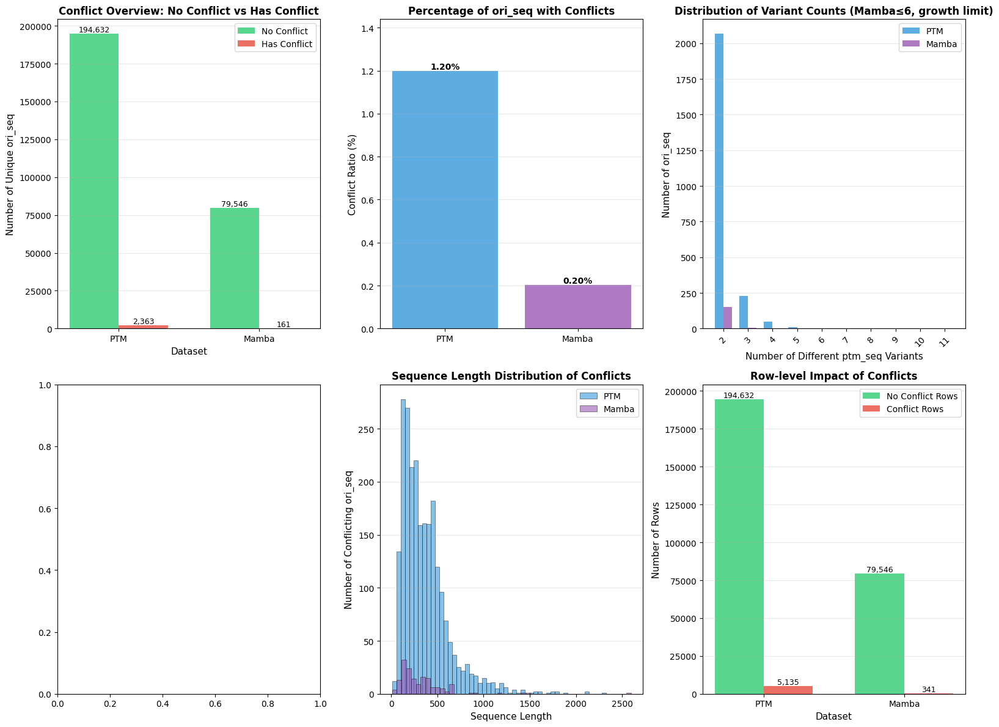

📊 DETAILED CONFLICT STATISTICS

🔍 PTM Dataset:
   Total rows: 199,767
   Unique ori_seq: 196,995
   No conflict (1 variant): 194,632 (98.80%)
   Has conflict (>1 variant): 2,363 (1.20%)
   Rows affected by conflicts: 5,135 (2.57%)

   Variant Count Statistics:
      Mean variants per conflict: 2.17
      Median variants: 2
      Max variants: 11
      Min variants: 2

   Variant Counts:
      2 variants: 2,066 ori_seq
      3 variants: 231 ori_seq
      4 variants: 47 ori_seq
      5 variants: 11 ori_seq
      6 variants: 2 ori_seq
      7 variants: 1 ori_seq
      8 variants: 1 ori_seq
      9 variants: 1 ori_seq
      10 variants: 2 ori_seq
      11 variants: 1 ori_seq

   Conflicting Sequence Length Statistics:
      Mean length: 364.9
      Median length: 306.0
      Min length: 11
      Max length: 2327

🔍 Mamba Dataset:
   Total rows: 79,887
   Unique ori_seq: 79,707
   No conflict (1 variant): 79,546 (99.80%)
   Has conflict (>1 variant): 161 (0.20%)
   Rows affected by conflict

In [ ]:
import csv
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
from typing import Dict, List, Tuple
import pandas as pd

def analyze_conflicts_detailed(file_path: str) -> Dict[str, object]:
    """
    Analyze conflicts in detail: same ori_seq with different ptm_seq.
    
    @param file_path: Absolute path to CSV with ori_seq and ptm_seq columns.
    @returns: Dict with detailed conflict statistics.
    """
    variants: Dict[str, Counter] = defaultdict(Counter)
    total_rows = 0
    
    with open(file_path, newline="") as fh:
        reader = csv.DictReader(fh)
        for row in reader:
            total_rows += 1
            ori_seq = row["ori_seq"]
            ptm_seq = row["ptm_seq"]
            variants[ori_seq][ptm_seq] += 1
    
    # Categorize sequences
    no_conflict = []  # ori_seq with only one ptm_seq
    conflicts = []    # ori_seq with multiple ptm_seq variants
    variant_counts = []  # Number of variants per conflicting ori_seq
    conflict_seq_lengths = []  # Lengths of conflicting sequences
    
    for ori_seq, ptm_counter in variants.items():
        variant_count = len(ptm_counter)
        if variant_count > 1:
            conflicts.append(ori_seq)
            variant_counts.append(variant_count)
            conflict_seq_lengths.append(len(ori_seq))
        else:
            no_conflict.append(ori_seq)
    
    # Calculate total rows affected by conflicts
    conflict_rows = sum(variants[ori_seq].total() for ori_seq in conflicts)
    
    return {
        "total_rows": total_rows,
        "unique_ori_seq": len(variants),
        "no_conflict_count": len(no_conflict),
        "conflict_count": len(conflicts),
        "conflict_rows": conflict_rows,
        "conflict_ratio": len(conflicts) / len(variants) if len(variants) > 0 else 0,
        "variant_counts": variant_counts,
        "conflict_seq_lengths": conflict_seq_lengths,
        "variant_distribution": Counter(variant_counts),
    }


def visualize_conflicts(ptm_stats: Dict, mamba_stats: Dict) -> None:
    """
    Create comprehensive visualizations for conflict analysis.
    
    @param ptm_stats: Detailed conflict statistics for PTM dataset.
    @param mamba_stats: Detailed conflict statistics for Mamba dataset.
    @returns: None.
    """
    fig = plt.figure(figsize=(16, 12))
    
    # 1. Overall conflict comparison (bar chart)
    ax1 = plt.subplot(2, 3, 1)
    datasets = ['PTM', 'Mamba']
    unique_ori = [ptm_stats['unique_ori_seq'], mamba_stats['unique_ori_seq']]
    conflicts = [ptm_stats['conflict_count'], mamba_stats['conflict_count']]
    no_conflicts = [ptm_stats['no_conflict_count'], mamba_stats['no_conflict_count']]
    
    x = np.arange(len(datasets))
    width = 0.35
    ax1.bar(x - width/2, no_conflicts, width, label='No Conflict', color='#2ecc71', alpha=0.8)
    ax1.bar(x + width/2, conflicts, width, label='Has Conflict', color='#e74c3c', alpha=0.8)
    ax1.set_xlabel('Dataset', fontsize=11)
    ax1.set_ylabel('Number of Unique ori_seq', fontsize=11)
    ax1.set_title('Conflict Overview: No Conflict vs Has Conflict', fontsize=12, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(datasets)
    ax1.legend()
    ax1.grid(True, alpha=0.3, axis='y')
    
    # Add value labels on bars
    for i, (nc, c) in enumerate(zip(no_conflicts, conflicts)):
        ax1.text(i - width/2, nc, f'{nc:,}', ha='center', va='bottom', fontsize=9)
        ax1.text(i + width/2, c, f'{c:,}', ha='center', va='bottom', fontsize=9)
    
    # 2. Conflict ratio (percentage)
    ax2 = plt.subplot(2, 3, 2)
    conflict_ratios = [ptm_stats['conflict_ratio'] * 100, mamba_stats['conflict_ratio'] * 100]
    bars = ax2.bar(datasets, conflict_ratios, color=['#3498db', '#9b59b6'], alpha=0.8)
    ax2.set_ylabel('Conflict Ratio (%)', fontsize=11)
    ax2.set_title('Percentage of ori_seq with Conflicts', fontsize=12, fontweight='bold')
    ax2.set_ylim(0, max(conflict_ratios) * 1.2)
    ax2.grid(True, alpha=0.3, axis='y')
    
    # Add value labels
    for bar, ratio in zip(bars, conflict_ratios):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
                f'{ratio:.2f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    # 3. Variant count distribution (how many different ptm_seq per ori_seq)
    ax3 = plt.subplot(2, 3, 3)
    ptm_variant_dist = ptm_stats['variant_distribution']
    mamba_variant_dist = mamba_stats['variant_distribution']
    
    max_variants = max(max(ptm_variant_dist.keys()) if ptm_variant_dist else [0],
                      max(mamba_variant_dist.keys()) if mamba_variant_dist else [0])
    variant_range = range(2, max_variants + 1)  # Show up to 20 variants
    
    ptm_counts = [ptm_variant_dist.get(v, 0) for v in variant_range]
    mamba_counts = [mamba_variant_dist.get(v, 0) for v in variant_range]
    
    x = np.arange(len(variant_range))
    width = 0.35
    ax3.bar(x - width/2, ptm_counts, width, label='PTM', color='#3498db', alpha=0.8)
    ax3.bar(x + width/2, mamba_counts, width, label='Mamba', color='#9b59b6', alpha=0.8)
    ax3.set_xlabel('Number of Different ptm_seq Variants', fontsize=11)
    ax3.set_ylabel('Number of ori_seq', fontsize=11)
    ax3.set_title('Distribution of Variant Counts', fontsize=12, fontweight='bold')
    ax3.set_xticks(x)
    ax3.set_xticklabels(variant_range, rotation=45)
    ax3.legend()
    ax3.grid(True, alpha=0.3, axis='y')
    
    # 4. Cumulative distribution of conflicts by variant count
    ax4 = plt.subplot(2, 3, 4)
    ptm_cumulative = []
    mamba_cumulative = []
    cumulative_variants = []
    
    for v in variant_range:
        ptm_cum = sum(ptm_variant_dist.get(i, 0) for i in range(2, v + 1))
        mamba_cum = sum(mamba_variant_dist.get(i, 0) for i in range(2, v + 1))
        ptm_cumulative.append(ptm_cum)
        mamba_cumulative.append(mamba_cum)
        cumulative_variants.append(v)
    
    ax4.plot(cumulative_variants, ptm_cumulative, marker='o', label='PTM', 
             linewidth=2, markersize=4, color='#3498db')
    ax4.plot(cumulative_variants, mamba_cumulative, marker='s', label='Mamba', 
             linewidth=2, markersize=4, color='#9b59b6')
    ax4.fill_between(cumulative_variants, ptm_cumulative, alpha=0.3, color='#3498db')
    ax4.fill_between(cumulative_variants, mamba_cumulative, alpha=0.3, color='#9b59b6')
    ax4.set_xlabel('Maximum Number of Variants', fontsize=11)
    ax4.set_ylabel('Cumulative Count of Conflicting ori_seq', fontsize=11)
    ax4.set_title('Cumulative Distribution of Conflicts', fontsize=12, fontweight='bold')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # 5. Sequence length distribution for conflicting sequences
    ax5 = plt.subplot(2, 3, 5)
    if ptm_stats['conflict_seq_lengths']:
        ax5.hist(ptm_stats['conflict_seq_lengths'], bins=50, alpha=0.6, 
                label='PTM', color='#3498db', edgecolor='black', linewidth=0.5)
    if mamba_stats['conflict_seq_lengths']:
        ax5.hist(mamba_stats['conflict_seq_lengths'], bins=50, alpha=0.6, 
                label='Mamba', color='#9b59b6', edgecolor='black', linewidth=0.5)
    ax5.set_xlabel('Sequence Length', fontsize=11)
    ax5.set_ylabel('Number of Conflicting ori_seq', fontsize=11)
    ax5.set_title('Sequence Length Distribution of Conflicts', fontsize=12, fontweight='bold')
    ax5.legend()
    ax5.grid(True, alpha=0.3, axis='y')
    
    # 6. Conflict impact: rows affected
    ax6 = plt.subplot(2, 3, 6)
    conflict_rows = [ptm_stats['conflict_rows'], mamba_stats['conflict_rows']]
    total_rows = [ptm_stats['total_rows'], mamba_stats['total_rows']]
    no_conflict_rows = [t - c for t, c in zip(total_rows, conflict_rows)]
    
    x = np.arange(len(datasets))
    width = 0.35
    ax6.bar(x - width/2, no_conflict_rows, width, label='No Conflict Rows', 
            color='#2ecc71', alpha=0.8)
    ax6.bar(x + width/2, conflict_rows, width, label='Conflict Rows', 
            color='#e74c3c', alpha=0.8)
    ax6.set_xlabel('Dataset', fontsize=11)
    ax6.set_ylabel('Number of Rows', fontsize=11)
    ax6.set_title('Row-level Impact of Conflicts', fontsize=12, fontweight='bold')
    ax6.set_xticks(x)
    ax6.set_xticklabels(datasets)
    ax6.legend()
    ax6.grid(True, alpha=0.3, axis='y')
    
    # Add value labels
    for i, (ncr, cr) in enumerate(zip(no_conflict_rows, conflict_rows)):
        ax6.text(i - width/2, ncr, f'{ncr:,}', ha='center', va='bottom', fontsize=9)
        ax6.text(i + width/2, cr, f'{cr:,}', ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed statistics
    print("=" * 80)
    print("📊 DETAILED CONFLICT STATISTICS")
    print("=" * 80)
    
    for name, stats in [("PTM", ptm_stats), ("Mamba", mamba_stats)]:
        print(f"\n🔍 {name} Dataset:")
        print(f"   Total rows: {stats['total_rows']:,}")
        print(f"   Unique ori_seq: {stats['unique_ori_seq']:,}")
        print(f"   No conflict (1 variant): {stats['no_conflict_count']:,} ({stats['no_conflict_count']/stats['unique_ori_seq']*100:.2f}%)")
        print(f"   Has conflict (>1 variant): {stats['conflict_count']:,} ({stats['conflict_ratio']*100:.2f}%)")
        print(f"   Rows affected by conflicts: {stats['conflict_rows']:,} ({stats['conflict_rows']/stats['total_rows']*100:.2f}%)")
        
        if stats['variant_counts']:
            print(f"\n   Variant Count Statistics:")
            variant_arr = np.array(stats['variant_counts'])
            print(f"      Mean variants per conflict: {np.mean(variant_arr):.2f}")
            print(f"      Median variants: {int(np.median(variant_arr))}")
            print(f"      Max variants: {int(np.max(variant_arr))}")
            print(f"      Min variants: {int(np.min(variant_arr))}")
            
            print(f"\n   Variant Counts:")
            variant_dist = stats['variant_distribution']
            for variant_count in sorted(variant_dist.keys()):
                count = variant_dist[variant_count]
                print(f"      {variant_count} variants: {count:,} ori_seq")
        
        if stats['conflict_seq_lengths']:
            length_arr = np.array(stats['conflict_seq_lengths'])
            print(f"\n   Conflicting Sequence Length Statistics:")
            print(f"      Mean length: {np.mean(length_arr):.1f}")
            print(f"      Median length: {np.median(length_arr):.1f}")
            print(f"      Min length: {int(np.min(length_arr))}")
            print(f"      Max length: {int(np.max(length_arr))}")
    
    print("\n" + "=" * 80)


# Analyze conflicts in detail
ptm_detailed = analyze_conflicts_detailed(ptm_path)
mamba_detailed = analyze_conflicts_detailed(mamba_path)

# Create visualizations
visualize_conflicts(ptm_detailed, mamba_detailed)


## Single-Position Token Conflicts
Detect conflicts that occur at a single token position within equally long PTM tokenized sequences.



In [ ]:
# Modified visualization to show ALL variants (not limited to 20)
# This cell replaces the variant distribution and cumulative plots in cell 9

# Re-analyze to get updated stats
ptm_detailed_all = analyze_conflicts_detailed(ptm_path)
mamba_detailed_all = analyze_conflicts_detailed(mamba_path)

# Create modified visualization function
def visualize_conflicts_all_variants(ptm_stats: Dict, mamba_stats: Dict) -> None:
    """
    Create visualizations showing ALL variant counts (no limit).
    
    @param ptm_stats: Detailed conflict statistics for PTM dataset.
    @param mamba_stats: Detailed conflict statistics for Mamba dataset.
    @returns: None.
    """
    fig = plt.figure(figsize=(18, 10))
    
    # 1. Overall conflict comparison (bar chart) - same as before
    ax1 = plt.subplot(2, 3, 1)
    datasets = ['PTM', 'Mamba']
    conflicts = [ptm_stats['conflict_count'], mamba_stats['conflict_count']]
    no_conflicts = [ptm_stats['no_conflict_count'], mamba_stats['no_conflict_count']]
    
    x = np.arange(len(datasets))
    width = 0.35
    ax1.bar(x - width/2, no_conflicts, width, label='No Conflict', color='#2ecc71', alpha=0.8)
    ax1.bar(x + width/2, conflicts, width, label='Has Conflict', color='#e74c3c', alpha=0.8)
    ax1.set_xlabel('Dataset', fontsize=11)
    ax1.set_ylabel('Number of Unique ori_seq', fontsize=11)
    ax1.set_title('Conflict Overview: No Conflict vs Has Conflict', fontsize=12, fontweight='bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(datasets)
    ax1.legend()
    ax1.grid(True, alpha=0.3, axis='y')
    
    for i, (nc, c) in enumerate(zip(no_conflicts, conflicts)):
        ax1.text(i - width/2, nc, f'{nc:,}', ha='center', va='bottom', fontsize=9)
        ax1.text(i + width/2, c, f'{c:,}', ha='center', va='bottom', fontsize=9)
    
    # 2. Conflict ratio (percentage) - same as before
    ax2 = plt.subplot(2, 3, 2)
    conflict_ratios = [ptm_stats['conflict_ratio'] * 100, mamba_stats['conflict_ratio'] * 100]
    bars = ax2.bar(datasets, conflict_ratios, color=['#3498db', '#9b59b6'], alpha=0.8)
    ax2.set_ylabel('Conflict Ratio (%)', fontsize=11)
    ax2.set_title('Percentage of ori_seq with Conflicts', fontsize=12, fontweight='bold')
    ax2.set_ylim(0, max(conflict_ratios) * 1.2)
    ax2.grid(True, alpha=0.3, axis='y')
    
    for bar, ratio in zip(bars, conflict_ratios):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
                f'{ratio:.2f}%', ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    # 3. Variant count distribution - MODIFIED: Show ALL variants
    ax3 = plt.subplot(2, 3, 3)
    ptm_variant_dist = ptm_stats['variant_distribution']
    mamba_variant_dist = mamba_stats['variant_distribution']
    
    # Get ALL variant counts (no limit)
    all_ptm_variants = set(ptm_variant_dist.keys()) if ptm_variant_dist else set()
    all_mamba_variants = set(mamba_variant_dist.keys()) if mamba_variant_dist else set()
    all_variants = sorted(all_ptm_variants | all_mamba_variants)
    variant_range = [v for v in all_variants if v >= 2]  # All variants, starting from 2
    
    ptm_counts = [ptm_variant_dist.get(v, 0) for v in variant_range]
    mamba_counts = [mamba_variant_dist.get(v, 0) for v in variant_range]
    
    x = np.arange(len(variant_range))
    width = 0.35
    ax3.bar(x - width/2, ptm_counts, width, label='PTM', color='#3498db', alpha=0.8)
    ax3.bar(x + width/2, mamba_counts, width, label='Mamba', color='#9b59b6', alpha=0.8)
    ax3.set_xlabel('Number of Different ptm_seq Variants', fontsize=11)
    ax3.set_ylabel('Number of ori_seq', fontsize=11)
    ax3.set_title(f'Distribution of Variant Counts (All {len(variant_range)} variants)', fontsize=12, fontweight='bold')
    
    # Adjust x-axis labels based on number of variants
    if len(variant_range) <= 30:
        ax3.set_xticks(x)
        ax3.set_xticklabels(variant_range, rotation=45, ha='right')
    else:
        step = max(1, len(variant_range) // 20)
        ax3.set_xticks(x[::step])
        ax3.set_xticklabels([variant_range[i] for i in range(0, len(variant_range), step)], 
                           rotation=45, ha='right')
        if len(variant_range) > 1:
            ax3.set_xticks(list(ax3.get_xticks()) + [x[0], x[-1]])
            ax3.set_xticklabels(list(ax3.get_xticklabels()) + [str(variant_range[0]), str(variant_range[-1])], 
                               rotation=45, ha='right')
    
    ax3.legend()
    ax3.grid(True, alpha=0.3, axis='y')
    
    # 4. Cumulative distribution - MODIFIED: Show ALL variants
    ax4 = plt.subplot(2, 3, 4)
    ptm_cumulative = []
    mamba_cumulative = []
    cumulative_variants = []
    
    # Calculate cumulative for ALL variants
    for v in variant_range:
        ptm_cum = sum(ptm_variant_dist.get(i, 0) for i in variant_range if i <= v)
        mamba_cum = sum(mamba_variant_dist.get(i, 0) for i in variant_range if i <= v)
        ptm_cumulative.append(ptm_cum)
        mamba_cumulative.append(mamba_cum)
        cumulative_variants.append(v)
    
    ax4.plot(cumulative_variants, ptm_cumulative, marker='o', label='PTM', 
             linewidth=2, markersize=3, color='#3498db')
    ax4.plot(cumulative_variants, mamba_cumulative, marker='s', label='Mamba', 
             linewidth=2, markersize=3, color='#9b59b6')
    ax4.fill_between(cumulative_variants, ptm_cumulative, alpha=0.3, color='#3498db')
    ax4.fill_between(cumulative_variants, mamba_cumulative, alpha=0.3, color='#9b59b6')
    ax4.set_xlabel('Maximum Number of Variants', fontsize=11)
    ax4.set_ylabel('Cumulative Count of Conflicting ori_seq', fontsize=11)
    ax4.set_title(f'Cumulative Distribution of Conflicts (All {len(variant_range)} variants)', fontsize=12, fontweight='bold')
    ax4.legend()
    ax4.grid(True, alpha=0.3)
    
    # 5. Sequence length distribution for conflicting sequences - same as before
    ax5 = plt.subplot(2, 3, 5)
    if ptm_stats['conflict_seq_lengths']:
        ax5.hist(ptm_stats['conflict_seq_lengths'], bins=50, alpha=0.6, 
                label='PTM', color='#3498db', edgecolor='black', linewidth=0.5)
    if mamba_stats['conflict_seq_lengths']:
        ax5.hist(mamba_stats['conflict_seq_lengths'], bins=50, alpha=0.6, 
                label='Mamba', color='#9b59b6', edgecolor='black', linewidth=0.5)
    ax5.set_xlabel('Sequence Length', fontsize=11)
    ax5.set_ylabel('Number of Conflicting ori_seq', fontsize=11)
    ax5.set_title('Sequence Length Distribution of Conflicts', fontsize=12, fontweight='bold')
    ax5.legend()
    ax5.grid(True, alpha=0.3, axis='y')
    
    # 6. Conflict impact: rows affected - same as before
    ax6 = plt.subplot(2, 3, 6)
    conflict_rows = [ptm_stats['conflict_rows'], mamba_stats['conflict_rows']]
    total_rows = [ptm_stats['total_rows'], mamba_stats['total_rows']]
    no_conflict_rows = [t - c for t, c in zip(total_rows, conflict_rows)]
    
    x = np.arange(len(datasets))
    width = 0.35
    ax6.bar(x - width/2, no_conflict_rows, width, label='No Conflict Rows', 
            color='#2ecc71', alpha=0.8)
    ax6.bar(x + width/2, conflict_rows, width, label='Conflict Rows', 
            color='#e74c3c', alpha=0.8)
    ax6.set_xlabel('Dataset', fontsize=11)
    ax6.set_ylabel('Number of Rows', fontsize=11)
    ax6.set_title('Row-level Impact of Conflicts', fontsize=12, fontweight='bold')
    ax6.set_xticks(x)
    ax6.set_xticklabels(datasets)
    ax6.legend()
    ax6.grid(True, alpha=0.3, axis='y')
    
    for i, (ncr, cr) in enumerate(zip(no_conflict_rows, conflict_rows)):
        ax6.text(i - width/2, ncr, f'{ncr:,}', ha='center', va='bottom', fontsize=9)
        ax6.text(i + width/2, cr, f'{cr:,}', ha='center', va='bottom', fontsize=9)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed statistics with ALL variant counts
    print("=" * 80)
    print("📊 DETAILED CONFLICT STATISTICS (ALL VARIANTS)")
    print("=" * 80)
    
    for name, stats in [("PTM", ptm_stats), ("Mamba", mamba_stats)]:
        print(f"\n🔍 {name} Dataset:")
        print(f"   Total rows: {stats['total_rows']:,}")
        print(f"   Unique ori_seq: {stats['unique_ori_seq']:,}")
        print(f"   No conflict (1 variant): {stats['no_conflict_count']:,} ({stats['no_conflict_count']/stats['unique_ori_seq']*100:.2f}%)")
        print(f"   Has conflict (>1 variant): {stats['conflict_count']:,} ({stats['conflict_ratio']*100:.2f}%)")
        print(f"   Rows affected by conflicts: {stats['conflict_rows']:,} ({stats['conflict_rows']/stats['total_rows']*100:.2f}%)")
        
        if stats['variant_counts']:
            variant_arr = np.array(stats['variant_counts'])
            print(f"\n   Variant Count Statistics:")
            print(f"      Mean variants per conflict: {np.mean(variant_arr):.2f}")
            print(f"      Median variants: {int(np.median(variant_arr))}")
            print(f"      Max variants: {int(np.max(variant_arr))}")
            print(f"      Min variants: {int(np.min(variant_arr))}")
            
            print(f"\n   ALL Variant Counts (showing every variant count):")
            variant_dist = stats['variant_distribution']
            for variant_count in sorted(variant_dist.keys()):
                count = variant_dist[variant_count]
                print(f"      {variant_count} variants: {count:,} ori_seq")
        
        if stats['conflict_seq_lengths']:
            length_arr = np.array(stats['conflict_seq_lengths'])
            print(f"\n   Conflicting Sequence Length Statistics:")
            print(f"      Mean length: {np.mean(length_arr):.1f}")
            print(f"      Median length: {np.median(length_arr):.1f}")
            print(f"      Min length: {int(np.min(length_arr))}")
            print(f"      Max length: {int(np.max(length_arr))}")
    
    print("\n" + "=" * 80)


# Create visualizations with ALL variants
visualize_conflicts_all_variants(ptm_detailed_all, mamba_detailed_all)


In [22]:
from typing import Any


def tokenize_ptm_seq(ptm_seq: str) -> List[str]:
    """
    @param ptm_seq: PTM-annotated sequence with tokens enclosed in <>.
    @returns: List of tokens mixing single residues and PTM markers.
    """
    tokens: List[str] = []
    i = 0
    while i < len(ptm_seq):
        ch = ptm_seq[i]
        if ch == "<":
            end = ptm_seq.find(">", i + 1)
            if end == -1:
                break
            tokens.append(ptm_seq[i : end + 1])
            i = end + 1
        else:
            tokens.append(ch)
            i += 1
    return tokens


def find_single_position_token_conflicts(
    file_path: str, limit: int = 10
) -> Dict[str, Any]:
    """
    @param file_path: Absolute path to CSV with ori_seq and ptm_seq columns.
    @param limit: Max number of conflict examples to keep in the sample list.
    @returns: Dict with unique ori count, total conflict count, and samples.
    """
    variants: Dict[str, Counter] = defaultdict(Counter)
    with open(file_path, newline="") as fh:
        reader = csv.DictReader(fh)
        for row in reader:
            variants[row["ori_seq"]][row["ptm_seq"]] += 1

    total_conflicts = 0
    samples: List[Dict[str, Any]] = []

    for ori_seq, ptm_counter in variants.items():
        entries: List[Tuple[str, List[str], int]] = []
        for ptm_seq, cnt in ptm_counter.items():
            entries.append((ptm_seq, tokenize_ptm_seq(ptm_seq), cnt))

        length_groups: Dict[int, List[Tuple[str, List[str], int]]] = defaultdict(list)
        for ptm_seq, tokens, cnt in entries:
            length_groups[len(tokens)].append((ptm_seq, tokens, cnt))

        for _, group in length_groups.items():
            pattern_map: Dict[Tuple[int, Tuple[str, ...]], List[Tuple[str, str, int]]] = defaultdict(list)
            for ptm_seq, tokens, cnt in group:
                for idx, token in enumerate(tokens):
                    pattern = tuple(tokens[:idx] + ["__WILD__"] + tokens[idx + 1 :])
                    pattern_map[(idx, pattern)].append((ptm_seq, token, cnt))

            for (idx, _), bucket in pattern_map.items():
                token_set = {token for _, token, _ in bucket}
                if len(token_set) <= 1:
                    continue

                total_conflicts += 1
                if len(samples) < limit:
                    ptm_variants = [
                        {"ptm_seq": seq, "token": token, "count": cnt}
                        for seq, token, cnt in sorted(
                            bucket, key=lambda item: item[2], reverse=True
                        )
                    ]
                    samples.append(
                        {
                            "ori_seq": ori_seq,
                            "position": idx,
                            "variant_count": len(ptm_variants),
                            "ptm_variants": ptm_variants,
                        }
                    )

    return {
        "unique_ori_seq": len(variants),
        "conflict_count": total_conflicts,
        "conflicts": samples,
    }


def print_single_position_conflicts(label: str, stats: Dict[str, Any]) -> None:
    """
    @param label: Dataset label for display.
    @param stats: Result from find_single_position_token_conflicts.
    @returns: None.
    """
    print(f"=== {label} single-position token conflicts ===")
    print(
        f"Unique ori_seq: {stats['unique_ori_seq']} | Conflicts: {stats['conflict_count']} (showing up to {len(stats['conflicts'])})"
    )
    for conflict in stats["conflicts"]:
        print(
            f"ori_seq len={len(conflict['ori_seq'])}, position={conflict['position']}, variants={conflict['variant_count']}"
        )
        for variant in conflict["ptm_variants"]:
            print(
                f"  token={variant['token']} | count={variant['count']} | ptm_seq={variant['ptm_seq']}"
            )
        print("---")


ptm_single_pos = find_single_position_token_conflicts(ptm_path, limit=10)
mamba_single_pos = find_single_position_token_conflicts(mamba_path, limit=10)

print_single_position_conflicts("PTM", ptm_single_pos)
print_single_position_conflicts("Mamba", mamba_single_pos)



=== PTM single-position token conflicts ===
Unique ori_seq: 196995 | Conflicts: 366 (showing up to 10)
ori_seq len=251, position=143, variants=2
  token=<N6-acetyllysine> | count=1 | ptm_seq=MSFPSSPPALPAIVARFAVGRPVRAVWVNELGGVTFRVDSGMGAGCEFIKVARRGTADFANEARRLRWAAPYLAVPRVLGVGVDGDWAWLHTDALPGLSAVHPRWRASPQVAVPALGAGLRTLHDSLPVHSCPFDWSTASRLA<N6-acetyllysine>LAPARRAELGDSPPVDRLVVCHGDACSPNTILDDTGRCCGHVDFGNLGVADRWADLAVATLSLQWNFPDYPGQVRDDEFFAAYGVAPDPARIDYYRRLWQAEDD<Phosphoserine><Phosphoserine>R
  token=K | count=1 | ptm_seq=MSFPSSPPALPAIVARFAVGRPVRAVWVNELGGVTFRVDSGMGAGCEFIKVARRGTADFANEARRLRWAAPYLAVPRVLGVGVDGDWAWLHTDALPGLSAVHPRWRASPQVAVPALGAGLRTLHDSLPVHSCPFDWSTASRLAKLAPARRAELGDSPPVDRLVVCHGDACSPNTILDDTGRCCGHVDFGNLGVADRWADLAVATLSLQWNFPDYPGQVRDDEFFAAYGVAPDPARIDYYRRLWQAEDD<Phosphoserine><Phosphoserine>R
---
ori_seq len=261, position=68, variants=2
  token=<N6-acetyllysine> | count=1 | ptm_seq=MAEPFFRMMEILVPSIVAANGNKITFEGLENIPERGGALIALNHTSYVDWVPASIAAHHRRRRLRFMI<N6-acetyllysine>AEMQDVRAVNYVIKHAQLIPVDRSVGA

## Duplicate Pair Audit
Summarize duplicate (ori_seq, ptm_seq) pairs per dataset and highlight shared records across files.



In [ ]:
import csv
from collections import Counter
from itertools import islice
from pathlib import Path
from typing import Dict, List, Tuple, Set

ptm_path = Path("/home/zz/zheng/ptm-mlm/datasets/ptm.csv")
mamba_path = Path("/home/zz/zheng/ptm-mlm/datasets/mamba.csv")


def summarize_duplicate_pairs(
    file_path: Path,
    key_cols: Tuple[str, str] = ("ori_seq", "ptm_seq")
) -> Dict[str, object]:
    """
    /**
     * @param file_path Absolute path to the CSV.
     * @param key_cols Column names in order: (ori_seq, ptm_seq).
     * @param top_n How many top duplicate pairs to keep for display.
     * @returns Summary dict with counts and top duplicate pairs.
     */
    """
    counts: Counter[Tuple[str, str]] = Counter()
    total_rows = 0

    with file_path.open(newline="") as fh:
        reader = csv.DictReader(fh)
        for row in reader:
            total_rows += 1
            key = (row[key_cols[0]], row[key_cols[1]])
            counts[key] += 1

    dup_counts: Dict[Tuple[str, str], int] = {k: v for k, v in counts.items() if v > 1}
    top_dups: List[Tuple[Tuple[str, str], int]] = sorted(
        dup_counts.items(), key=lambda kv: kv[1], reverse=True
    )

    return {
        "file": str(file_path),
        "total_rows": total_rows,
        "duplicate_rows": sum(dup_counts.values()),
        "unique_duplicate_pairs": len(dup_counts),
        "top_dups": top_dups,
        "pair_keys": set(counts.keys()),
    }


def print_dup_summary(label: str, summary: Dict[str, object], sample_len: int = 30) -> None:
    """
    /**
     * @param label Dataset label for printing.
     * @param summary Output from summarize_duplicate_pairs.
     * @param sample_len Max chars to show per sequence in samples.
     * @returns None (prints a small report).
     */
    """
    print(f"== {label} ==")
    print(f"rows: {summary['total_rows']:,}")
    print(f"duplicate rows (same ori_seq+ptm_seq): {summary['duplicate_rows']:,}")
    print(f"unique duplicate pairs: {summary['unique_duplicate_pairs']:,}")
    if summary["top_dups"]:
        print("top duplicate pairs:")
        for (ori, ptm), cnt in summary["top_dups"]:
            print(
                f"  count={cnt} | ori_seq={ori[:sample_len]}... | ptm_seq={ptm[:sample_len]}..."
            )
    print()


def print_shared_pairs(
    label_a: str,
    label_b: str,
    summary_a: Dict[str, object],
    summary_b: Dict[str, object],
    limit: int = 5,
    sample_len: int = 30,
) -> None:
    """
    /**
     * @param label_a Label for first dataset.
     * @param label_b Label for second dataset.
     * @param summary_a First summary dict.
     * @param summary_b Second summary dict.
     * @param limit Max shared pairs to print.
     * @param sample_len Max chars to show per sequence in samples.
     * @returns None (prints shared pair info).
     */
    """
    shared: Set[Tuple[str, str]] = summary_a["pair_keys"] & summary_b["pair_keys"]
    print(f"Cross-file shared (ori_seq, ptm_seq) pairs: {len(shared):,}")
    for ori, ptm in islice(shared, limit):
        print(f"  ori_seq={ori[:sample_len]}... | ptm_seq={ptm[:sample_len]}...")
    print()


ptm_summary = summarize_duplicate_pairs(ptm_path)
mamba_summary = summarize_duplicate_pairs(mamba_path)

print_dup_summary("PTM", ptm_summary)
print_dup_summary("Mamba", mamba_summary)
print_shared_pairs("PTM", "Mamba", ptm_summary, mamba_summary, limit=5)

== PTM ==
rows: 200,535
duplicate rows (same ori_seq+ptm_seq): 1,480
unique duplicate pairs: 712
top duplicate pairs:
  count=8 | ori_seq=MSHQLTFADSEFSSKRRQTRKEIFLSRMEQ... | ptm_seq=MSHQLTFADSEFSSKRRQTRKEIFLSRMEQ...
  count=6 | ori_seq=MIDVLGPEKRRRRTTQEKIAIVQQSFEPGM... | ptm_seq=MIDVLGPE<N6-acetyllysine>RRRRT...
  count=5 | ori_seq=MTKTVSTSKKPRKQHSPEFRSEALKLAERI... | ptm_seq=MTKTVSTSKKPRKQHSPEFRSEAL<N6-ac...
  count=5 | ori_seq=MSGRGKQGGKARAKAKTRSSRAGLQFPVGR... | ptm_seq=M<Phosphoserine>G<Omega-N-meth...
  count=5 | ori_seq=MEQTFVAIKPDGVQRGLCGEVMKFIQPMKH... | ptm_seq=<N-acetylmethionine>EQTFVAIKPD...
  count=5 | ori_seq=MGLKVNVSAIFMAVLLTLQTPTGQIHWGNL... | ptm_seq=MGLKVNVSAIFMAVLLTLQTPTGQIHWG<N...
  count=5 | ori_seq=QQDYTGWMDF... | ptm_seq=QQD<Sulfotyrosine>TGWMDF...
  count=5 | ori_seq=MESQQLSNYPHISHGSACASVTSKEVHTNQ... | ptm_seq=MESQQLSNYPHI<Phosphoserine>HG<...
  count=4 | ori_seq=AFSGILAEADIAAALKACEAADSFNYKAFF... | ptm_seq=<N-acetylalanine>FSGILAEADIAAA...
  count=4 | ori_seq=MSWRGR

## Sequence Length Distribution
Analyze and compare sequence length distributions for PTM and Mamba datasets.


In [4]:
import csv
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from typing import Dict, List, Tuple

ptm_path = "/home/zz/zheng/ptm-mlm/datasets/ptm.csv"
mamba_path = "/home/zz/zheng/ptm-mlm/datasets/mamba.csv"


def get_sequence_lengths(file_path: str, seq_column: str = "ori_seq") -> List[int]:
    """
    Extract sequence lengths from CSV file.
    
    @param file_path: Absolute path to CSV file.
    @param seq_column: Column name containing sequences (default: "ori_seq").
    @returns: List of sequence lengths.
    """
    lengths: List[int] = []
    with open(file_path, newline="") as fh:
        reader = csv.DictReader(fh)
        for row in reader:
            seq = row[seq_column]
            lengths.append(len(seq))
    return lengths


def calculate_length_statistics(lengths: List[int]) -> Dict[str, float]:
    """
    Calculate statistical measures for sequence lengths.
    
    @param lengths: List of sequence lengths.
    @returns: Dictionary with statistical measures.
    """
    arr = np.array(lengths)
    return {
        "count": len(lengths),
        "mean": float(np.mean(arr)),
        "median": float(np.median(arr)),
        "std": float(np.std(arr)),
        "min": int(np.min(arr)),
        "max": int(np.max(arr)),
        "q25": float(np.percentile(arr, 25)),
        "q75": float(np.percentile(arr, 75)),
        "q90": float(np.percentile(arr, 90)),
        "q95": float(np.percentile(arr, 95)),
        "q99": float(np.percentile(arr, 99)),
    }


def print_statistics(label: str, stats: Dict[str, float]) -> None:
    """
    Print formatted statistics.
    
    @param label: Dataset label.
    @param stats: Statistics dictionary.
    @returns: None.
    """
    print(f"=== {label} Sequence Length Statistics ===")
    print(f"Total sequences: {stats['count']:,}")
    print(f"Mean: {stats['mean']:.2f}")
    print(f"Median: {stats['median']:.2f}")
    print(f"Std: {stats['std']:.2f}")
    print(f"Min: {stats['min']}")
    print(f"Max: {stats['max']}")
    print(f"Q25: {stats['q25']:.2f}")
    print(f"Q75: {stats['q75']:.2f}")
    print(f"Q90: {stats['q90']:.2f}")
    print(f"Q95: {stats['q95']:.2f}")
    print(f"Q99: {stats['q99']:.2f}")
    print()


# Get sequence lengths for both datasets
ptm_lengths = get_sequence_lengths(ptm_path, "ori_seq")
mamba_lengths = get_sequence_lengths(mamba_path, "ori_seq")

# Calculate statistics
ptm_stats = calculate_length_statistics(ptm_lengths)
mamba_stats = calculate_length_statistics(mamba_lengths)

# Print statistics
print_statistics("PTM", ptm_stats)
print_statistics("Mamba", mamba_stats)


=== PTM Sequence Length Statistics ===
Total sequences: 199,767
Mean: 582.22
Median: 455.00
Std: 533.84
Min: 5
Max: 32767
Q25: 282.00
Q75: 714.00
Q90: 1091.00
Q95: 1435.00
Q99: 2538.34

=== Mamba Sequence Length Statistics ===
Total sequences: 79,887
Mean: 545.10
Median: 427.00
Std: 520.99
Min: 3
Max: 35213
Q25: 287.00
Q75: 629.00
Q90: 981.00
Q95: 1349.00
Q99: 2572.98



/tmp/ipykernel_1713213/928664885.py:15: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes[0, 1].boxplot(box_data, labels=["PTM", "Mamba"], patch_artist=True)


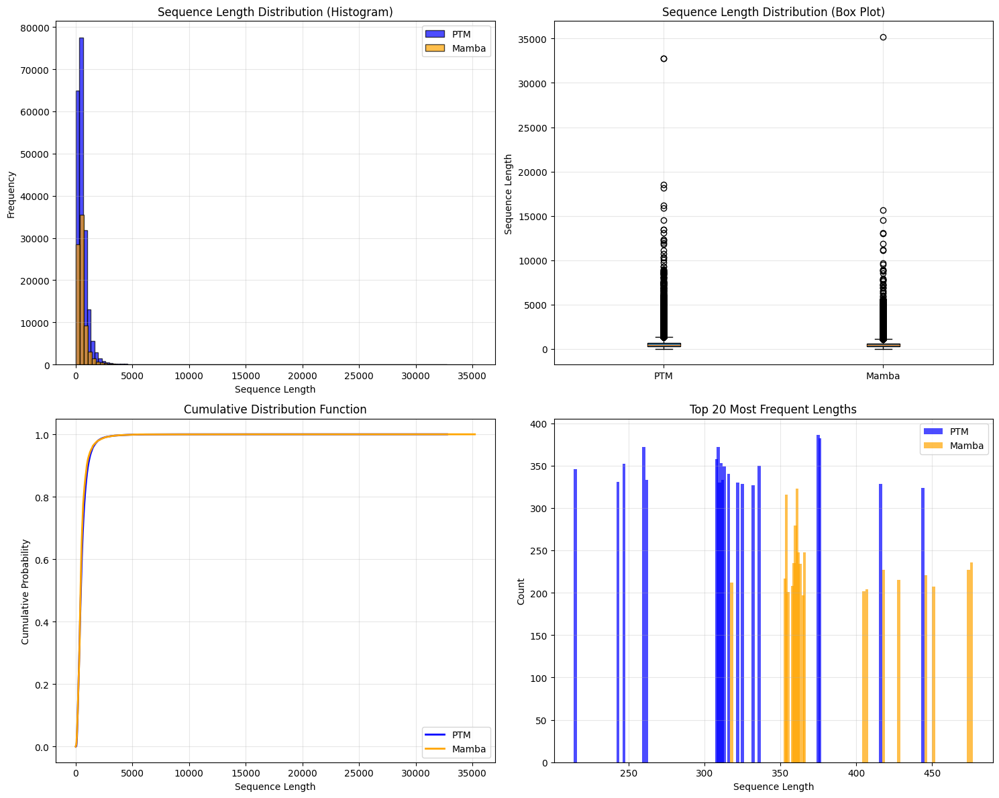

In [5]:
# Visualize length distributions
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Histogram comparison
axes[0, 0].hist(ptm_lengths, bins=100, alpha=0.7, label="PTM", color="blue", edgecolor="black")
axes[0, 0].hist(mamba_lengths, bins=100, alpha=0.7, label="Mamba", color="orange", edgecolor="black")
axes[0, 0].set_xlabel("Sequence Length")
axes[0, 0].set_ylabel("Frequency")
axes[0, 0].set_title("Sequence Length Distribution (Histogram)")
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Box plot comparison
box_data = [ptm_lengths, mamba_lengths]
axes[0, 1].boxplot(box_data, labels=["PTM", "Mamba"], patch_artist=True)
axes[0, 1].set_ylabel("Sequence Length")
axes[0, 1].set_title("Sequence Length Distribution (Box Plot)")
axes[0, 1].grid(True, alpha=0.3)

# Cumulative distribution
sorted_ptm = np.sort(ptm_lengths)
sorted_mamba = np.sort(mamba_lengths)
axes[1, 0].plot(sorted_ptm, np.arange(1, len(sorted_ptm) + 1) / len(sorted_ptm), 
                label="PTM", linewidth=2, color="blue")
axes[1, 0].plot(sorted_mamba, np.arange(1, len(sorted_mamba) + 1) / len(sorted_mamba), 
                label="Mamba", linewidth=2, color="orange")
axes[1, 0].set_xlabel("Sequence Length")
axes[1, 0].set_ylabel("Cumulative Probability")
axes[1, 0].set_title("Cumulative Distribution Function")
axes[1, 0].legend()
axes[1, 0].grid(True, alpha=0.3)

# Length frequency (top lengths)
ptm_length_counter = Counter(ptm_lengths)
mamba_length_counter = Counter(mamba_lengths)
top_ptm_lengths = dict(ptm_length_counter.most_common(20))
top_mamba_lengths = dict(mamba_length_counter.most_common(20))

x_ptm = list(top_ptm_lengths.keys())
y_ptm = list(top_ptm_lengths.values())
x_mamba = list(top_mamba_lengths.keys())
y_mamba = list(top_mamba_lengths.values())

axes[1, 1].bar([x - 1 for x in x_ptm], y_ptm, width=2, alpha=0.7, label="PTM", color="blue")
axes[1, 1].bar([x + 1 for x in x_mamba], y_mamba, width=2, alpha=0.7, label="Mamba", color="orange")
axes[1, 1].set_xlabel("Sequence Length")
axes[1, 1].set_ylabel("Count")
axes[1, 1].set_title("Top 20 Most Frequent Lengths")
axes[1, 1].legend()
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


In [6]:
# Detailed length distribution table
def get_length_distribution_table(lengths: List[int], bins: List[int]) -> Dict[str, int]:
    """
    Count sequences in each length bin.
    
    @param lengths: List of sequence lengths.
    @param bins: List of bin boundaries (e.g., [0, 50, 100, 200, ...]).
    @returns: Dictionary mapping bin ranges to counts.
    """
    distribution: Dict[str, int] = {}
    arr = np.array(lengths)
    
    for i in range(len(bins) - 1):
        bin_label = f"{bins[i]}-{bins[i+1]-1}"
        count = np.sum((arr >= bins[i]) & (arr < bins[i+1]))
        distribution[bin_label] = int(count)
    
    # Last bin: >= last boundary
    bin_label = f">={bins[-1]}"
    count = np.sum(arr >= bins[-1])
    distribution[bin_label] = int(count)
    
    return distribution


# Define bins for length distribution
bins = [0, 50, 100, 200, 300, 500, 1000, 2000, 5000]

ptm_dist = get_length_distribution_table(ptm_lengths, bins)
mamba_dist = get_length_distribution_table(mamba_lengths, bins)

print("=== Length Distribution by Bins ===")
print(f"{'Length Range':<15} {'PTM Count':<15} {'PTM %':<10} {'Mamba Count':<15} {'Mamba %':<10}")
print("-" * 70)

for bin_range in sorted(set(list(ptm_dist.keys()) + list(mamba_dist.keys()))):
    ptm_count = ptm_dist.get(bin_range, 0)
    mamba_count = mamba_dist.get(bin_range, 0)
    ptm_pct = (ptm_count / len(ptm_lengths) * 100) if len(ptm_lengths) > 0 else 0
    mamba_pct = (mamba_count / len(mamba_lengths) * 100) if len(mamba_lengths) > 0 else 0
    
    print(f"{bin_range:<15} {ptm_count:<15,} {ptm_pct:<10.2f} {mamba_count:<15,} {mamba_pct:<10.2f}")


=== Length Distribution by Bins ===
Length Range    PTM Count       PTM %      Mamba Count     Mamba %   
----------------------------------------------------------------------
0-49            371             0.19       541             0.68      
100-199         22,667          11.35      8,143           10.19     
1000-1999       20,907          10.47      6,081           7.61      
200-299         27,648          13.84      10,270          12.86     
2000-4999       3,635           1.82       1,489           1.86      
300-499         56,372          28.22      28,027          35.08     
50-99           4,206           2.11       2,283           2.86      
500-999         63,718          31.90      22,957          28.74     
>=5000          243             0.12       96              0.12      


## PTM Integrated Dataset Analysis
Analyze PTM type distribution and UNIPROT_ID statistics from the integrated dataset.


📊 Loading CSV file...


/tmp/ipykernel_639127/3255542230.py:10: DtypeWarning: Columns (4,7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csv_path)


✅ Dataset loaded successfully!
   Total rows: 2,723,750
   Total columns: 9

📋 Column names:
   1. UNIPROT_ID
   2. LOCATION
   3. MODIFICATION_TYPE
   4. PMID
   5. FUNCTIONAL_ROLE_STANDARDIZED
   6. SPECIES
   7. SOURCE
   8. symbol
   9. TAXID

🔍 First few rows:


,UNIPROT_ID,LOCATION,MODIFICATION_TYPE,PMID,FUNCTIONAL_ROLE_STANDARDIZED,SPECIES,SOURCE,symbol,TAXID
0,-,180.0,Phosphorylation,16514067,Associate,BOVINE,PMADS,NaN,NaN
1,-,182.0,Phosphorylation,16514067,Associate,BOVINE,PMADS,NaN,NaN
2,A0A021WW32,10.0,Ubiquitination,28510597,NaN,Drosophila melanogaster,CPLM,vtd,7227.0
3,A0A021WW32,11.0,Ubiquitination,28510597,NaN,Drosophila melanogaster,CPLM,vtd,7227.0
4,A0A021WW32,39.0,Ubiquitination,28510597,NaN,Drosophila melanogaster,CPLM,vtd,7227.0


🔬 PTM TYPE (MODIFICATION_TYPE) ANALYSIS

📈 Total number of unique PTM types: 70

📊 PTM Type Distribution (sorted by count):
--------------------------------------------------------------------------------
Rank   PTM Type                                           Count           Percentage     
--------------------------------------------------------------------------------
1      Phosphorylation                                    1,621,411       59.53          %
2      Ubiquitination                                     631,748         23.19          %
3      Acetylation                                        216,368         7.94           %
4      SUMOylation                                        53,107          1.95           %
5      Glycosylation                                      45,393          1.67           %
6      Succinylation                                      30,295          1.11           %
7      Methylation                                        22,909          0.84

In [6]:
# Analyze UNIPROT_ID statistics
print("=" * 80)
print("🧬 UNIPROT_ID ANALYSIS")
print("=" * 80)

# Count unique UNIPROT_IDs
unique_uniprot_ids = df['UNIPROT_ID'].nunique()
print(f"\n📈 Total number of unique UNIPROT_IDs: {unique_uniprot_ids:,}")

# Count records with missing UNIPROT_ID (if any)
missing_uniprot = df['UNIPROT_ID'].isna().sum()
valid_uniprot = df['UNIPROT_ID'].notna().sum()

print(f"\n📊 UNIPROT_ID Coverage:")
print(f"   Valid UNIPROT_IDs: {valid_uniprot:,} ({valid_uniprot/len(df)*100:.2f}%)")
print(f"   Missing UNIPROT_IDs: {missing_uniprot:,} ({missing_uniprot/len(df)*100:.2f}%)")

# Count how many PTM records per UNIPROT_ID
uniprot_ptm_counts = df['UNIPROT_ID'].value_counts()

print(f"\n📈 UNIPROT_ID PTM Record Statistics:")
print(f"   Mean PTM records per UNIPROT_ID: {uniprot_ptm_counts.mean():.2f}")
print(f"   Median PTM records per UNIPROT_ID: {uniprot_ptm_counts.median():.2f}")
print(f"   Max PTM records for a single UNIPROT_ID: {uniprot_ptm_counts.max():,}")
print(f"   Min PTM records for a single UNIPROT_ID: {uniprot_ptm_counts.min():,}")

# Show top UNIPROT_IDs with most PTM records
print(f"\nUNIPROT_IDs:")
print("-" * 80)
print(f"{'Rank':<6} {'UNIPROT_ID':<20} {'PTM Count':<15}")
print("-" * 80)
for rank, (uniprot_id, count) in enumerate(uniprot_ptm_counts.items(), 1):
    print(f"{rank:<6} {str(uniprot_id):<20} {count:<15,}")


🧬 UNIPROT_ID ANALYSIS

📈 Total number of unique UNIPROT_IDs: 329,281

📊 UNIPROT_ID Coverage:
   Valid UNIPROT_IDs: 2,723,750 (100.00%)
   Missing UNIPROT_IDs: 0 (0.00%)

📈 UNIPROT_ID PTM Record Statistics:
   Mean PTM records per UNIPROT_ID: 8.27
   Median PTM records per UNIPROT_ID: 3.00
   Max PTM records for a single UNIPROT_ID: 2,854
   Min PTM records for a single UNIPROT_ID: 1

UNIPROT_IDs:
--------------------------------------------------------------------------------
Rank   UNIPROT_ID           PTM Count      
--------------------------------------------------------------------------------
1      Q09666               2,854          
2      Q15149               2,687          
3      Q8WZ42               2,647          
4      A2ASS6               2,567          
5      Q9BVU3               1,498          
6      P46013               1,353          
7      P27816               1,339          
8      Q02817               1,260          
9      P49792               1,011         

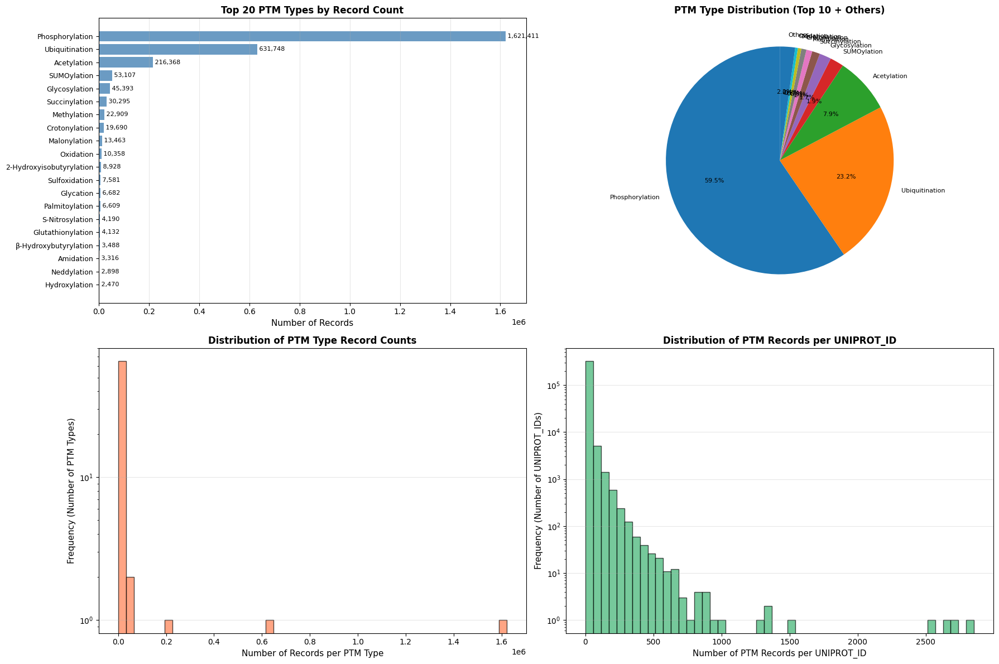


📋 FINAL SUMMARY
✅ Total records in dataset: 2,723,750
✅ Unique PTM types: 70
✅ Unique UNIPROT_IDs: 329,281
✅ Average PTM records per UNIPROT_ID: 8.27


In [7]:
# Visualize PTM type distribution
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# 1. Top 20 PTM types (bar chart)
top_20_ptm = ptm_type_counts.head(20)
axes[0, 0].barh(range(len(top_20_ptm)), top_20_ptm.values, color='steelblue', alpha=0.8)
axes[0, 0].set_yticks(range(len(top_20_ptm)))
axes[0, 0].set_yticklabels(top_20_ptm.index, fontsize=9)
axes[0, 0].set_xlabel('Number of Records', fontsize=11)
axes[0, 0].set_title('Top 20 PTM Types by Record Count', fontsize=12, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3, axis='x')
axes[0, 0].invert_yaxis()

# Add value labels
for i, v in enumerate(top_20_ptm.values):
    axes[0, 0].text(v, i, f' {v:,}', va='center', fontsize=8)

# 2. PTM type distribution (pie chart for top 10)
top_10_ptm = ptm_type_counts.head(10)
other_count = ptm_type_counts.iloc[10:].sum()
if other_count > 0:
    pie_data = list(top_10_ptm.values) + [other_count]
    pie_labels = list(top_10_ptm.index) + ['Others']
else:
    pie_data = list(top_10_ptm.values)
    pie_labels = list(top_10_ptm.index)

axes[0, 1].pie(pie_data, labels=pie_labels, autopct='%1.1f%%', startangle=90, 
               textprops={'fontsize': 8})
axes[0, 1].set_title('PTM Type Distribution (Top 10 + Others)', fontsize=12, fontweight='bold')

# 3. PTM type count distribution (histogram)
axes[1, 0].hist(ptm_type_counts.values, bins=50, color='coral', alpha=0.7, edgecolor='black')
axes[1, 0].set_xlabel('Number of Records per PTM Type', fontsize=11)
axes[1, 0].set_ylabel('Frequency (Number of PTM Types)', fontsize=11)
axes[1, 0].set_title('Distribution of PTM Type Record Counts', fontsize=12, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3, axis='y')
axes[1, 0].set_yscale('log')

# 4. UNIPROT_ID PTM record distribution (histogram)
axes[1, 1].hist(uniprot_ptm_counts.values, bins=50, color='mediumseagreen', alpha=0.7, edgecolor='black')
axes[1, 1].set_xlabel('Number of PTM Records per UNIPROT_ID', fontsize=11)
axes[1, 1].set_ylabel('Frequency (Number of UNIPROT_IDs)', fontsize=11)
axes[1, 1].set_title('Distribution of PTM Records per UNIPROT_ID', fontsize=12, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3, axis='y')
axes[1, 1].set_yscale('log')

plt.tight_layout()
plt.show()

# Print final summary
print("\n" + "=" * 80)
print("📋 FINAL SUMMARY")
print("=" * 80)
print(f"✅ Total records in dataset: {len(df):,}")
print(f"✅ Unique PTM types: {unique_ptm_types}")
print(f"✅ Unique UNIPROT_IDs: {unique_uniprot_ids:,}")
print(f"✅ Average PTM records per UNIPROT_ID: {uniprot_ptm_counts.mean():.2f}")
print("=" * 80)


In [8]:
# Analyze FUNCTIONAL_ROLE_STANDARDIZED distribution
print("=" * 80)
print("🎯 FUNCTIONAL_ROLE_STANDARDIZED ANALYSIS")
print("=" * 80)

# Count unique functional roles
unique_functional_roles = df['FUNCTIONAL_ROLE_STANDARDIZED'].nunique()
print(f"\n📈 Total number of unique functional roles: {unique_functional_roles}")

# Count records with missing functional role (if any)
missing_role = df['FUNCTIONAL_ROLE_STANDARDIZED'].isna().sum()
valid_role = df['FUNCTIONAL_ROLE_STANDARDIZED'].notna().sum()

print(f"\n📊 Functional Role Coverage:")
print(f"   Valid functional roles: {valid_role:,} ({valid_role/len(df)*100:.2f}%)")
print(f"   Missing functional roles: {missing_role:,} ({missing_role/len(df)*100:.2f}%)")

# Count occurrences of each functional role
functional_role_counts = df['FUNCTIONAL_ROLE_STANDARDIZED'].value_counts().sort_values(ascending=False)

print(f"\n📊 Functional Role Distribution (sorted by count):")
print("-" * 80)
print(f"{'Rank':<6} {'Functional Role':<50} {'Count':<15} {'Percentage':<15}")
print("-" * 80)

total_records = len(df)
for rank, (role, count) in enumerate(functional_role_counts.items(), 1):
    percentage = (count / total_records) * 100
    # Handle NaN values
    role_display = str(role) if pd.notna(role) else "NaN/Missing"
    print(f"{rank:<6} {role_display:<50} {count:<15,} {percentage:<15.2f}%")

print("-" * 80)
print(f"{'Total':<6} {'':<50} {total_records:<15,} {'100.00%':<15}")

# Summary statistics
print(f"\n📈 Summary Statistics:")
if len(functional_role_counts) > 0:
    most_common_role = functional_role_counts.index[0]
    most_common_count = functional_role_counts.iloc[0]
    most_common_display = str(most_common_role) if pd.notna(most_common_role) else "NaN/Missing"
    print(f"   Most common functional role: {most_common_display} ({most_common_count:,} records)")
    
    least_common_role = functional_role_counts.index[-1]
    least_common_count = functional_role_counts.iloc[-1]
    least_common_display = str(least_common_role) if pd.notna(least_common_role) else "NaN/Missing"
    print(f"   Least common functional role: {least_common_display} ({least_common_count:,} records)")
    print(f"   Mean records per functional role: {functional_role_counts.mean():.2f}")
    print(f"   Median records per functional role: {functional_role_counts.median():.2f}")

# Show all functional roles (if not too many)
if unique_functional_roles <= 50:
    print(f"\n📋 Complete list of all functional roles:")
    print("-" * 80)
    for rank, (role, count) in enumerate(functional_role_counts.items(), 1):
        role_display = str(role) if pd.notna(role) else "NaN/Missing"
        print(f"{rank:2d}. {role_display:<50} ({count:,} records)")
else:
    print(f"\n📋 Showing top 30 functional roles (total: {unique_functional_roles}):")
    print("-" * 80)
    for rank, (role, count) in enumerate(functional_role_counts.head(30).items(), 1):
        role_display = str(role) if pd.notna(role) else "NaN/Missing"
        print(f"{rank:2d}. {role_display:<50} ({count:,} records)")


🎯 FUNCTIONAL_ROLE_STANDARDIZED ANALYSIS

📈 Total number of unique functional roles: 33

📊 Functional Role Coverage:
   Valid functional roles: 25,165 (0.92%)
   Missing functional roles: 2,698,585 (99.08%)

📊 Functional Role Distribution (sorted by count):
--------------------------------------------------------------------------------
Rank   Functional Role                                    Count           Percentage     
--------------------------------------------------------------------------------
1      Enhance                                            9,594           0.35           %
2      Impair                                             7,575           0.28           %
3      Enhance;Impair                                     3,952           0.15           %
4      Impair;Enhance                                     2,493           0.09           %
5      Inhibit                                            579             0.02           %
6      Associate                    

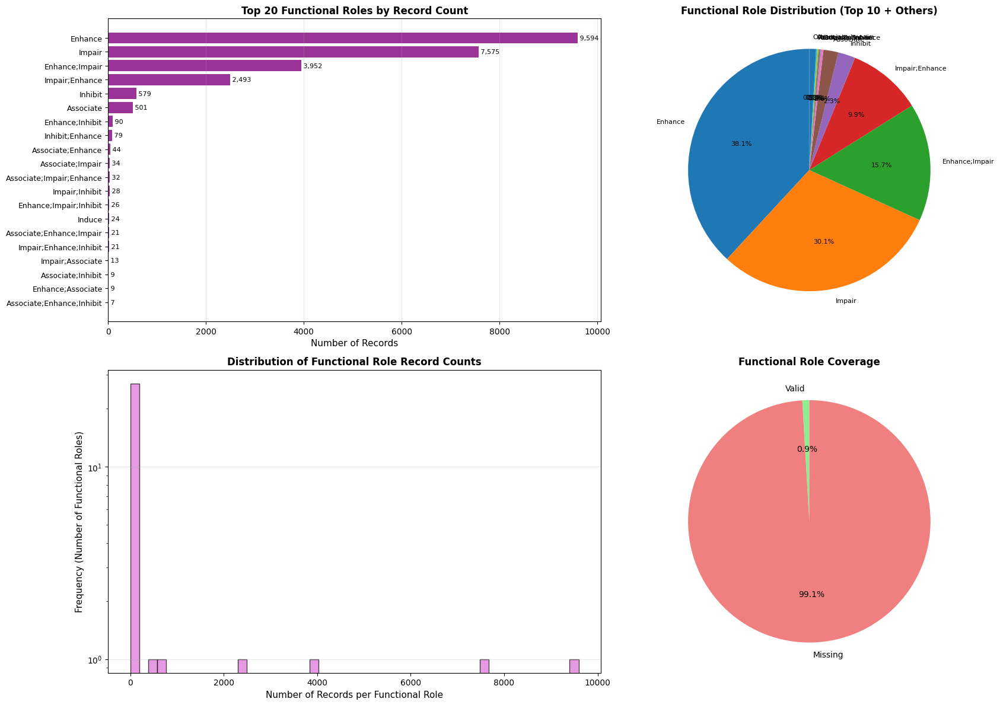


📋 FUNCTIONAL ROLE SUMMARY
✅ Total records in dataset: 2,723,750
✅ Unique functional roles: 33
✅ Records with valid functional role: 25,165 (0.92%)
⚠️  Records with missing functional role: 2,698,585 (99.08%)


In [9]:
# Visualize functional role distribution
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Filter out NaN values for visualization
functional_role_counts_clean = functional_role_counts.copy()
functional_role_counts_clean.index = functional_role_counts_clean.index.fillna('Missing/NaN')

# 1. Top 20 functional roles (bar chart)
top_20_roles = functional_role_counts_clean.head(20)
axes[0, 0].barh(range(len(top_20_roles)), top_20_roles.values, color='purple', alpha=0.8)
axes[0, 0].set_yticks(range(len(top_20_roles)))
axes[0, 0].set_yticklabels(top_20_roles.index, fontsize=9)
axes[0, 0].set_xlabel('Number of Records', fontsize=11)
axes[0, 0].set_title('Top 20 Functional Roles by Record Count', fontsize=12, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3, axis='x')
axes[0, 0].invert_yaxis()

# Add value labels
for i, v in enumerate(top_20_roles.values):
    axes[0, 0].text(v, i, f' {v:,}', va='center', fontsize=8)

# 2. Functional role distribution (pie chart for top 10)
top_10_roles = functional_role_counts_clean.head(10)
other_count = functional_role_counts_clean.iloc[10:].sum()
if other_count > 0:
    pie_data = list(top_10_roles.values) + [other_count]
    pie_labels = list(top_10_roles.index) + ['Others']
else:
    pie_data = list(top_10_roles.values)
    pie_labels = list(top_10_roles.index)

axes[0, 1].pie(pie_data, labels=pie_labels, autopct='%1.1f%%', startangle=90, 
               textprops={'fontsize': 8})
axes[0, 1].set_title('Functional Role Distribution (Top 10 + Others)', fontsize=12, fontweight='bold')

# 3. Functional role count distribution (histogram)
axes[1, 0].hist(functional_role_counts_clean.values, bins=50, color='orchid', alpha=0.7, edgecolor='black')
axes[1, 0].set_xlabel('Number of Records per Functional Role', fontsize=11)
axes[1, 0].set_ylabel('Frequency (Number of Functional Roles)', fontsize=11)
axes[1, 0].set_title('Distribution of Functional Role Record Counts', fontsize=12, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3, axis='y')
if functional_role_counts_clean.max() / functional_role_counts_clean.min() > 100:
    axes[1, 0].set_yscale('log')

# 4. Functional role coverage (valid vs missing)
if missing_role > 0:
    coverage_data = [valid_role, missing_role]
    coverage_labels = ['Valid', 'Missing']
    axes[1, 1].pie(coverage_data, labels=coverage_labels, autopct='%1.1f%%', 
                   startangle=90, colors=['lightgreen', 'lightcoral'])
    axes[1, 1].set_title('Functional Role Coverage', fontsize=12, fontweight='bold')
else:
    axes[1, 1].text(0.5, 0.5, '100% Coverage\n(No Missing Values)', 
                    ha='center', va='center', fontsize=14, fontweight='bold',
                    bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.5))
    axes[1, 1].set_title('Functional Role Coverage', fontsize=12, fontweight='bold')
    axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

# Print final summary for functional roles
print("\n" + "=" * 80)
print("📋 FUNCTIONAL ROLE SUMMARY")
print("=" * 80)
print(f"✅ Total records in dataset: {len(df):,}")
print(f"✅ Unique functional roles: {unique_functional_roles}")
print(f"✅ Records with valid functional role: {valid_role:,} ({valid_role/len(df)*100:.2f}%)")
if missing_role > 0:
    print(f"⚠️  Records with missing functional role: {missing_role:,} ({missing_role/len(df)*100:.2f}%)")
print("=" * 80)


## PTM Type Cumulative Density Plot
Cumulative density plot showing the distribution of PTM types sorted by frequency (from most to least common).


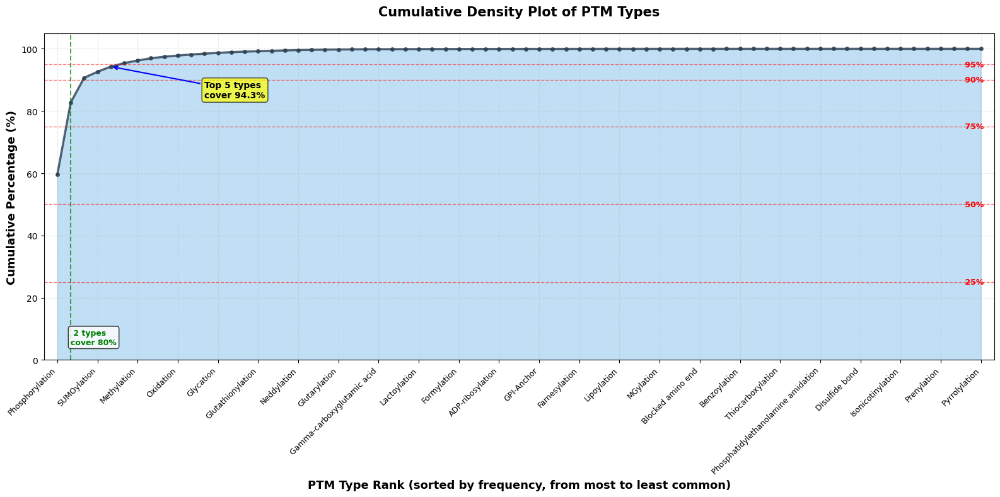

📊 CUMULATIVE DENSITY STATISTICS
Total PTM types: 70

Coverage by top N types:
  Top  1 types:  59.53%  (Phosphorylation...)
  Top  3 types:  90.67%  (Phosphorylation, Ubiquitination, Acetylation...)
  Top  5 types:  94.28%  (Phosphorylation, Ubiquitination, Acetylation, SUMOylation, G...)
  Top 10 types:  97.83%  (Phosphorylation, Ubiquitination, Acetylation, SUMOylation, G...)
  Top 20 types:  99.68%  (Phosphorylation, Ubiquitination, Acetylation, SUMOylation, G...)
  Top 30 types:  99.93%  (Phosphorylation, Ubiquitination, Acetylation, SUMOylation, G...)

  80% coverage: Top 2 types

  90% coverage: Top 3 types

  95% coverage: Top 6 types
